<a href="https://colab.research.google.com/github/maslory21/Testing/blob/main/lab5_cycle_gan_student.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Лабораторная работа**
*Naumov Anton (Any0019)*

*To contact me in telegram: @any0019*

В данном задании вашей задачей будет построить и обучить модель CycleGAN для задачи Img2Img.

---

Про задачу __Img2Img__:

- У вас есть 2 множества изображений ($A$ и $B$)
- Ваша задача - научиться превращать изображения из множества $A$ в изображения из множества $B$ и наоборот
- Бывают paired и unpaired множества
- В случае __paired__ множеств - для каждого изображения из $A$ существует конкретное изображение из $B$, в которое оно должно перейти (и наоборот). Примером такой пары множеств может быть (а) спутниковая фотграфия местности vs схематическая карта местности , (б) фотография фасада здания vs схема фасада здания , ...
- В случае __unpaired__ множеств - между множествами нет конкретных пар. Примером такой пары множеств может быть (а) фотографии с лошадьми vs фотографии с зебрами , (б) фотографии vs рисунки конкретного художника , ...

---

Про модель __CycleGAN__:

- Модель придумана для задачи Img2Img (в первую очередь unpaired версии) и основана на концепции GAN-ов
- В модели есть 2 генератора: $G_{A -> B}$ (задача которого - принимая на вход изображение из множества $A$ переводить его в изображение из множества $B$) и $G_{B -> A}$ (аналогично в другую сторону)
- Надо отметить что на вход генераторы не получают никакую дополнительную случайность, что делает обучение таких моделей проще
- В модели так же есть 2 дискриминатора: $D_{A}$ (задача которого - отличать реальные изображения из $A$ от сгенерированных с помощью $G_{B -> A}$ изображений) и $D_{B}$ (аналогично для $B$)
- Функцией ошибки будет, как и для GAN-ов, minmax игра между генераторами и дискриминаторами, но к ошибке генераторов добавится ещё и, так называемый, `cycle consistency loss`, который проверяет, что после двойного перехода изображения не меняются $G_{B -> A} \big( G_{A -> B} ( a ) \big) = a ; \forall a \in A$ и $G_{A -> B} \big( G_{B -> A} ( b ) \big) = b ; \forall b \in B$
- Так же можно добавлять или нет штраф за то, чтобы $G_{B -> A}$ не меняла изображения из $A$ и наоборот $G_{A -> B}$ не меняла изображения из $B$
- Оригинальная статья: https://arxiv.org/pdf/1703.10593.pdf

---

Ваша задача - ноутбук разбит на несколько частей, каждая со своими баллами

1. __Подготовка данных__ _(2 балла)_ --> требуется выбрать датасет для обучения (дано несколько на выбор) и составить пайплайн подготовки данных
2. __Составление модели__ _(6 баллов)_ --> требуется собрать нейросеть _(3 балла)_ и создать функции ошибки _(3 балла)_
3. __Подготовка обучения__ _(2 балла)_ --> требуется написать шаги обучения и валидации, визуализацию, а так же полный цикл обучения
4. __Обучение__ _(2 балла)_ --> требуется обучить модель
5. __Сбор своего датасета и обучение модели на нём__ _(3 балла)_ --> требуется собрать свой датасет и обучить на нём модель

***За наиболее интересные и качественные решения в пункте 5 так же предусмотрены дополнительные баллы***

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import Dataset, DataLoader


from torchvision import datasets, transforms as tr

from PIL import Image

import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# Для тёмной темы jupyter - уберите если не нужно
# plt.style.use('dark_background')

from tqdm.auto import tqdm, trange

import os
import sys
import requests
import cv2

from dataclasses import dataclass
import random


# 1. Подготовка данных (___2 балла___)

## 1.1 Выбор и скачивание датасета

In [ ]:
import os

path = os.path.expanduser('~/ML2_data')
print("Exists?", os.path.exists(path))

Exists? True


Dataset 'apple2orange'
Loading zip file...--2025-04-10 15:45:33--  http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/apple2orange.zip
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78456409 (75M) [application/zip]
Saving to: ‘/Users/dzmitry/ML2_data/apple2orange.zip’

/Users/dzmitry/ML2_ 100%[===================>]  74.82M  1.41MB/s    in 1m 48s  

2025-04-10 15:47:21 (713 KB/s) - ‘/Users/dzmitry/ML2_data/apple2orange.zip’ saved [78456409/78456409]

 --> done!
Unziping... --> done!
Provided splits: ['testA', 'trainB', 'testB', 'trainA']
Split 'testA' of dataset 'apple2orange' --> size: 266


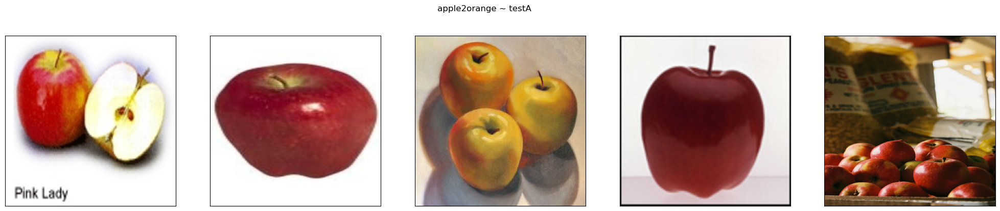

Split 'testB' of dataset 'apple2orange' --> size: 248


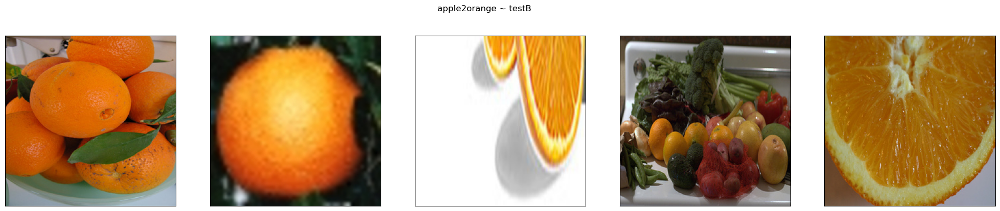

Split 'trainA' of dataset 'apple2orange' --> size: 995


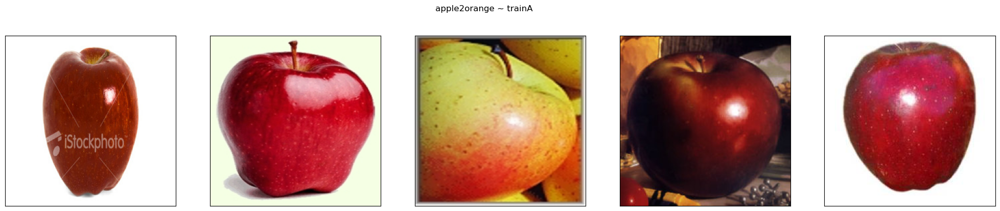

Split 'trainB' of dataset 'apple2orange' --> size: 1019


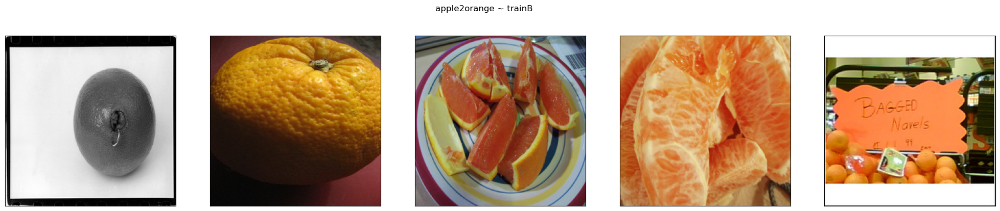


----------------------------



In [ ]:
# dataset_folder = "~/ML2_data"

dataset_folder = os.path.expanduser("~/ML2_data")
num_images_per_split = 5

os.environ["dataset_folder"] = dataset_folder
!mkdir -p ${dataset_folder}

# В этом цикле каждый из предложенных датасетов
#  - скачивается
#  - распаковывается
#  - отрисовывается + meta
#  - удаляется

# Предлагается посмотреть на все предложенные варианты датасетов и затем оставить один,
#  с которым захочется работать больше всего - закомментируйте (или удалите) все, кроме
#  выбранного, а так же закомментируйте строчки с удалением скачанного датасета
for dataset_name in [
    # Unpaired
    "apple2orange",
    # "summer2winter_yosemite",
    # "horse2zebra"
    # "monet2photo",
    # "cezanne2photo",
    # "ukiyoe2photo",
    # "vangogh2photo",
    # Paired
    # "maps",
    # "facades",
]:
    print(f"Dataset '{dataset_name}'")
    url = f"http://efrosgans.eecs.berkeley.edu/cyclegan/datasets/{dataset_name}.zip"
    download_path = os.path.join(dataset_folder, f"{dataset_name}.zip")
    target_folder = os.path.join(dataset_folder, dataset_name)

    # Чтобы bash вызовы знали соответствующие переменные
    os.environ["url"] = url
    os.environ["download_path"] = download_path
    os.environ["target_folder"] = target_folder

    print("Loading zip file...", end="")
    # Проверяем что нет такого загруженого файла
    if not os.path.isfile(download_path) or os.path.exists(target_folder):
        # # Можно загрузить через requests библиотеку
        # response = requests.get(url)
        # open(download_path, "wb").write(response.content)

        # Можно загрузить через wget
        !wget "{url}" -O "{download_path}"
    print(" --> done!")

    print("Unziping...", end="")
    # Распаковываем
    if os.path.exists(target_folder):
        !rm -r "{target_folder}"
    !mkdir -p "{dataset_folder}"
    !unzip -qq "{download_path}" -d "{dataset_folder}"
    print(" --> done!")

    # Удаляем zip-файл
    !rm "{download_path}"

    # Meta + Отрисовка
    print(f"Provided splits: {os.listdir(target_folder)}")
    # Удобный способ быстро получить датасет картинок с лэйблами, если картинки разложены по папкам в формате:
    # root_folder/label_name/img.jpg
    # (в нашем случае нет лэйблов, но картинки разложены в таком же формате, просто вместо label_name идёт
    #  split_name: trainA/testA/trainB/testB)
    dataset = datasets.ImageFolder(target_folder)

    inds_to_show = {i: [] for i, _ in enumerate(dataset.classes)}
    classes_full = 0
    for dataset_ind in range(len(dataset)):
        _, split_ind = dataset[dataset_ind]
        if len(inds_to_show[split_ind]) == num_images_per_split:
            continue
        inds_to_show[split_ind].append(dataset_ind)
        if len(inds_to_show[split_ind]) == num_images_per_split:
            classes_full += 1
        if classes_full == len(dataset.classes):
            break

    for split_name in sorted(dataset.classes):
        split_ind = dataset.class_to_idx[split_name]
        print(f"Split '{split_name}' of dataset '{dataset_name}'", end="")
        split_folder = os.path.join(target_folder, split_name)
        print(f" --> size: {len(os.listdir(split_folder))}")

        plt.subplots(1, num_images_per_split, figsize=(5 * num_images_per_split, 5))
        plt.suptitle(f"{dataset_name} ~ {split_name}", y=0.95)
        for i, dataset_ind in enumerate(inds_to_show[split_ind]):
            plt.subplot(1, num_images_per_split, i + 1)
            plt.imshow(dataset[dataset_ind][0])
            plt.xticks([])
            plt.yticks([])
        plt.show()

    # Удаляем скачанный датасет
    # !rm -r "{target_folder}"

    print("\n----------------------------\n")

## 1.2 Dataset и Transforms

В папке `target_folder` находятся несколько папок со сплитами для соответствующего датасета, в каждой папке сплита находятся сами `.jpg` изображения.

Давайте составим их в удобном для нас виде в отдельные датасеты для каждого сплита без лэйблов.

Для получения картинок можно использовать
```python
cv2.imread(img_path)[:, :, ::-1]  # каналы записаны в обратном порядке
```

In [ ]:
# Выбранный выше и скачанный датасет
# dataset_folder = "/home/jupyter/datasphere/project/datasets/img2img"
# dataset_folder = os.path.expanduser("~/ML2_data")
dataset_folder = os.path.expanduser('~/ML2_data')
dataset_name = "horse2zebra"
target_folder = os.path.join(dataset_folder, dataset_name)

print("target_folder : ", target_folder)

# Класс для датасета изображений без лэйблов с применением трансформов
class ImageDatasetNoLabel(Dataset):
    def __init__(self, dataset_dir, transforms = lambda x : x):
        # super(ImageDatasetNoLabel).__init__()

        super().__init__()
        self.dataset_dir = dataset_dir
        self.transforms = transforms

        extensions = ('.jpg', '.png')

        self.image_paths = [
            os.path.join(self.dataset_dir, fname)
            for fname in os.listdir(self.dataset_dir)
            if fname.lower().endswith(extensions)
        ]



    def __getitem__(self, index):

        img_path = self.image_paths[index]
        img = Image.open(img_path).convert("RGB")


        # print("type : ", type(img))
        # print("img : ", img)

        assert isinstance(img, (Image.Image, torch.Tensor)), \
            f"Expected PIL Image or torch.Tensor, got {type(img)}"

        return self.transforms(img)

    def __len__(self):
        return len(self.image_paths)

# Удобный класс для хранения всех наших датасетов
@dataclass
class DatasetsClass:
    train_a: ImageDatasetNoLabel
    train_b: ImageDatasetNoLabel
    test_a: ImageDatasetNoLabel
    test_b: ImageDatasetNoLabel


# Все датасеты без трансформов - чтобы посчитать статистики
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(os.path.join(target_folder, "trainA")),
    train_b=ImageDatasetNoLabel(os.path.join(target_folder, "trainB")),
    test_a=ImageDatasetNoLabel(os.path.join(target_folder, "testA")),
    test_b=ImageDatasetNoLabel(os.path.join(target_folder, "testB")),
)

target_folder :  /Users/dzmitry/ML2_data/horse2zebra


In [ ]:
print(ds.train_a[5])

print(type(ds.train_a[5]))


print(len(ds.train_a), len(ds.train_b))


<PIL.Image.Image image mode=RGB size=256x256 at 0x105AF37D0>
<class 'PIL.Image.Image'>
1067 1334


In [ ]:
def get_channel_statistics(dataset):
    """
    Функция для получения поканальных статистик (среднее и отклонение) по датасету
    """

    channel_mean = torch.zeros(3, dtype = torch.float)
    channel_std = torch.zeros(3, dtype = torch.float)


    for idx in range(len(dataset)):
        ts = tr.ToTensor()(dataset[idx])

        assert ts.shape[0] == 3
        channel_mean += ts.mean(dim = (1, 2))
        channel_std += ts.std(dim = (1, 2))
    channel_mean /= len(dataset)
    channel_std /= len(dataset)
    return channel_mean, channel_std

# Поканальное среднее и отклонение для A
channel_mean_a, channel_std_a = get_channel_statistics(ds.train_a)
print(channel_mean_a, channel_std_a)

# Поканальное среднее и отклонение для B
channel_mean_b, channel_std_b = get_channel_statistics(ds.train_b)
print(channel_mean_b, channel_std_b)

tensor([0.5266, 0.5188, 0.4580]) tensor([0.2035, 0.2061, 0.2208])
tensor([0.4832, 0.4673, 0.3972]) tensor([0.2318, 0.2249, 0.2193])


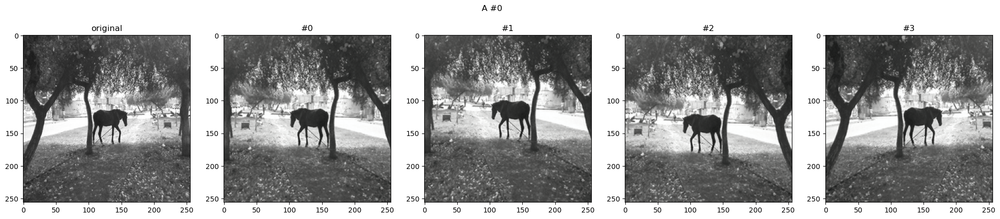

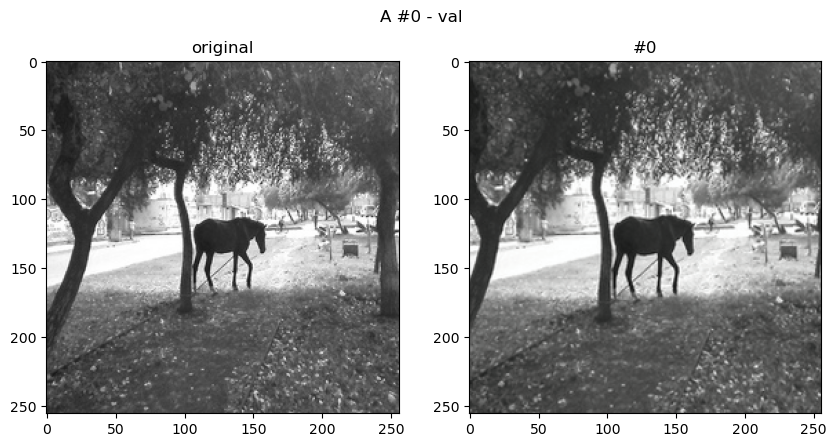

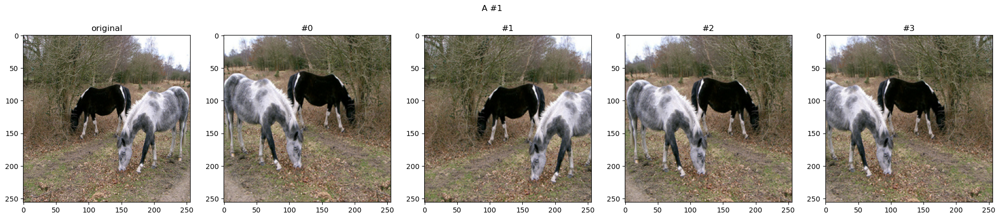

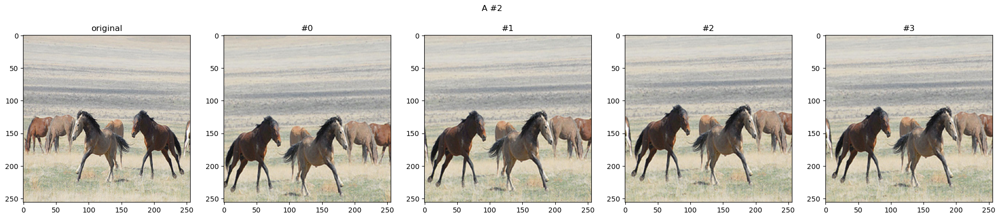

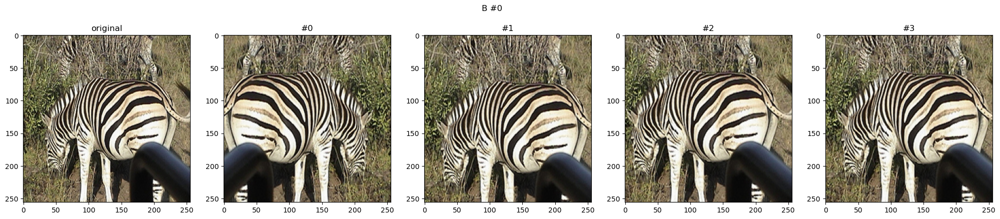

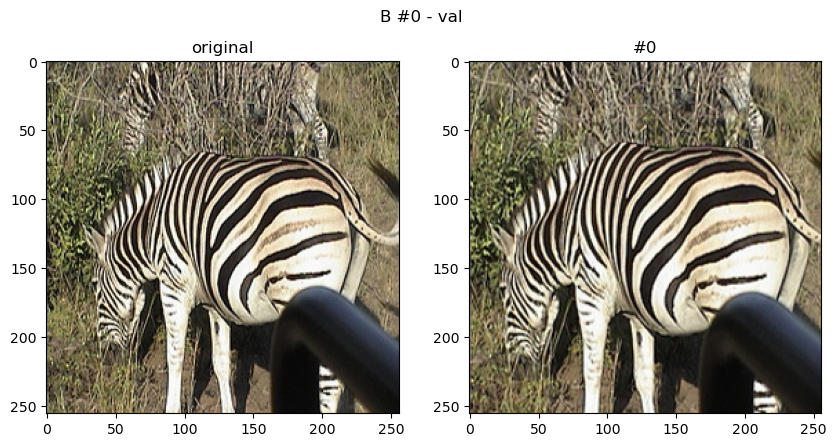

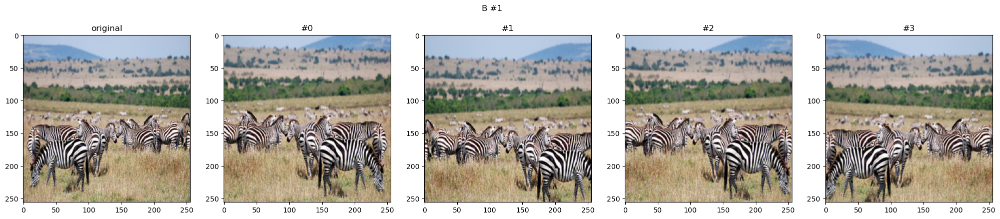

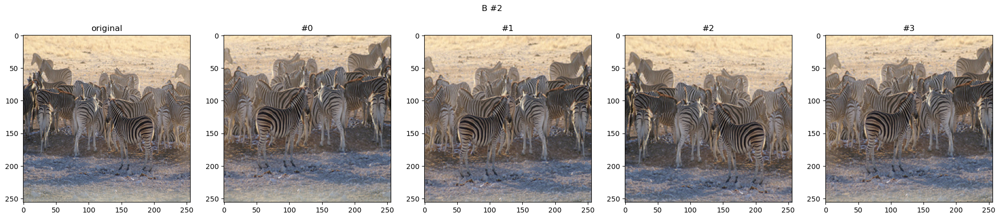

In [ ]:
# Функция для получения train и val transform-ов, а так же функции для де-нормализации изображения
def get_transforms(mean, std):
    train_transform = tr.Compose([

        tr.Resize(286, interpolation = tr.InterpolationMode.BICUBIC),
        tr.RandomCrop(256),
        tr.RandomHorizontalFlip(0.5),
        tr.ToTensor(),
        tr.Normalize(mean = mean, std = std)
    ])

    test_transform = tr.Compose([
        tr.Resize(286, interpolation = tr.InterpolationMode.BICUBIC),
        tr.CenterCrop(256),
        tr.ToTensor(),
        tr.Normalize(mean = mean, std = std)
    ])

    std_inverse = [1.0 / s for s in std]
    mean_inverse = [-m / s for m, s in zip(mean, std)]

    def de_normalize(img):

        # img = tr.ToTensor()(img_png)

        img_denormalized = tr.Normalize(mean = mean_inverse, std = std_inverse)(img)

        return tr.ToPILImage()(img_denormalized)



    return train_transform, test_transform, de_normalize


# Ваши гиперпараметры
hyperparams = dict(

)
# transform-ы для A и B
train_transform_a, val_transform_a, de_normalize_a = get_transforms(channel_mean_a, channel_std_a, **hyperparams)
train_transform_b, val_transform_b, de_normalize_b = get_transforms(channel_mean_b, channel_std_b, **hyperparams)


# Функция для визуализации transform-ов
def show_examples(dataset, transform, de_norm, num_per_image=3, image_index=0, title=""):
    fig, ax = plt.subplots(1, 1 + num_per_image, figsize=(5 * (1 + num_per_image), 5))

    image = dataset[image_index]

    plt.suptitle(title, y=0.95)

    plt.subplot(1, 1 + num_per_image, 1)
    plt.imshow(image)
    plt.title("original")

    for i in range(num_per_image):
        plt.subplot(1, 1 + num_per_image, i + 2)
        plt.title(f"#{i}")
        plt.imshow(de_norm(transform(image)))
    plt.show()

# Проверка на адекватность
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=0, title="A #0")
show_examples(ds.train_a, val_transform_a, de_normalize_a, num_per_image=1, image_index=0, title="A #0 - val")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=1, title="A #1")
show_examples(ds.train_a, train_transform_a, de_normalize_a, num_per_image=4, image_index=2, title="A #2")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=0, title="B #0")
show_examples(ds.train_b, val_transform_b, de_normalize_b, num_per_image=1, image_index=0, title="B #0 - val")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=1, title="B #1")
show_examples(ds.train_b, train_transform_b, de_normalize_b, num_per_image=4, image_index=2, title="B #2")

In [ ]:
# Все датасеты с трансформами
ds = DatasetsClass(
    train_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainA"),
        transforms=train_transform_a,
    ),
    train_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "trainB"),
        transforms=val_transform_b,
    ),
    test_a=ImageDatasetNoLabel(
        os.path.join(target_folder, "testA"),
        transforms=val_transform_a,
    ),
    test_b=ImageDatasetNoLabel(
        os.path.join(target_folder, "testB"),
        transforms=val_transform_b,
    ),
)

## 1.3 DataLoader

In [ ]:
@dataclass
class DataLoadersClass:
    train_a: DataLoader
    train_b: DataLoader
    test_a: DataLoader
    test_b: DataLoader

batch_size = 10

dataloaders = DataLoadersClass(
    train_a=DataLoader(
        dataset=ds.train_a,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    train_b=DataLoader(
        dataset=ds.train_b,
        batch_size=batch_size,
        shuffle=True,
        drop_last=True,
    ),
    test_a=DataLoader(
        dataset=ds.test_a,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
    test_b=DataLoader(
        dataset=ds.test_b,
        batch_size=batch_size,
        shuffle=False,
        drop_last=True,
    ),
)

# 2. Модель (___6 баллов___)

## 2.0 Любые вспомогательные модули и классы

In [ ]:
class ImagePool():
    def __init__(self, pool_size):

        self.pool_size = pool_size
        if self.pool_size > 0:
            self.num_imgs = 0
            self.images = []

    def query(self, images):
        if self.pool_size == 0:
            return images
        return_images = []
        for image in images:
            image = torch.unsqueeze(image.data, 0)
            if self.num_imgs < self.pool_size:
                self.num_imgs = self.num_imgs + 1
                self.images.append(image)
                return_images.append(image)
            else:
                p = random.uniform(0, 1)
                if p > 0.5:
                    random_id = random.randint(0, self.pool_size - 1)
                    tmp = self.images[random_id].clone()
                    self.images[random_id] = image
                    return_images.append(tmp)
                else:
                    return_images.append(image)
        return_images = torch.cat(return_images, 0)
        return return_images

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features)
        )

    def forward(self, x):
        return x + self.block(x)


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_nc=3):
        super().__init__()

        model = [
            nn.Conv2d(input_nc, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        model += [
            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        model += [
            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        model += [
            nn.Conv2d(256, 512, 4, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        ]

        model += [nn.Conv2d(512, 1, 4, padding=1)]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


In [ ]:
class Generator(nn.Module):
    def __init__(self, input_nc=3, output_nc=3, n_residual=6):
        super().__init__()


        model = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(input_nc, 64, 7),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        ]

        # Downsampling
        in_features = 64
        out_features = in_features * 2
        for _ in range(2):
            model += [
                nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features * 2


        for _ in range(n_residual):
            model += [ResidualBlock(in_features)]


        out_features = in_features // 2
        for _ in range(2):
            model += [
                nn.ConvTranspose2d(in_features, out_features, 3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True)
            ]
            in_features = out_features
            out_features = in_features // 2


        model += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, output_nc, 7),
            nn.Tanh()
        ]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)



In [ ]:
class CycleGAN(nn.Module):
    def __init__(self, device, criterion_gan, criterion_cycle, criterion_id, lr=0.0002, lambda_cycle=10, lambda_id=5, pool_size=50):
        super().__init__()
        self.device = device
        self.lambda_cycle = lambda_cycle
        self.lambda_id = lambda_id

        self.G_AB = Generator().to(device)
        self.G_BA = Generator().to(device)
        self.D_A = Discriminator().to(device)
        self.D_B = Discriminator().to(device)

        self.fake_A_pool = ImagePool(pool_size)
        self.fake_B_pool = ImagePool(pool_size)


        self._init_weights(self.G_AB)
        self._init_weights(self.G_BA)
        self._init_weights(self.D_A)
        self._init_weights(self.D_B)


        self.criterion_gan = criterion_gan

        self.criterion_cycle = criterion_cycle

        self.criterion_id = criterion_id

        self.optimizer_G = optim.Adam(
            list(self.G_AB.parameters()) + list(self.G_BA.parameters()),
            lr=lr, betas=(0.5, 0.999)
        )

        self.optimizer_D = optim.Adam(
            list(self.D_A.parameters()) + list(self.D_B.parameters()),
            lr=lr, betas=(0.5, 0.999)
        )

    def _init_weights(self, model):
        for m in model.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                nn.init.normal_(m.weight.data, 0.0, 0.02)
                if m.bias is not None:
                    nn.init.constant_(m.bias.data, 0.0)

            elif isinstance(m, nn.BatchNorm2d) or isinstance(m, nn.InstanceNorm2d):
                if m.weight is not None:
                    nn.init.normal_(m.weight.data, 1.0, 0.02)
                if m.bias is not None:
                    nn.init.constant_(m.bias.data, 0.0)

    def train_step(self, real_A, real_B):
        real_A, real_B = real_A.to(self.device), real_B.to(self.device)


        #  Train Generators

        self.optimizer_G.zero_grad()
        # Identity
        same_B = self.G_AB(real_B)
        loss_id_B = self.criterion_id(same_B, real_B) * self.lambda_id
        same_A = self.G_BA(real_A)
        loss_id_A = self.criterion_id(same_A, real_A) * self.lambda_id
        # GAN
        fake_B = self.G_AB(real_A)
        pred_fake_B = self.D_B(fake_B)
        loss_GAN_AB = self.criterion_gan(pred_fake_B, torch.ones_like(pred_fake_B))

        fake_A = self.G_BA(real_B)
        pred_fake_A = self.D_A(fake_A)
        loss_GAN_BA = self.criterion_gan(pred_fake_A, torch.ones_like(pred_fake_A))

        print("pred_fake_B range:", pred_fake_B.min().item(), pred_fake_B.max().item())

        # consistency
        recovered_A = self.G_BA(fake_B)
        loss_cycle_A = self.criterion_cycle(recovered_A, real_A) * self.lambda_cycle
        recovered_B = self.G_AB(fake_A)
        loss_cycle_B = self.criterion_cycle(recovered_B, real_B) * self.lambda_cycle

        # all losses combined
        loss_G = (loss_GAN_AB + loss_GAN_BA +
                 loss_cycle_A + loss_cycle_B +
                 loss_id_A + loss_id_B)
        loss_G.backward()
        self.optimizer_G.step()






        #  Train Discriminators
        self.optimizer_D.zero_grad()

        # Real
        pred_real_A = self.D_A(real_A)
        loss_D_real_A = self.criterion_gan(pred_real_A, torch.ones_like(pred_real_A))

        pred_real_B = self.D_B(real_B)
        loss_D_real_B = self.criterion_gan(pred_real_B, torch.ones_like(pred_real_B))

        # Fake
        fake_A_pooled = self.fake_A_pool.query(fake_A.detach())
        pred_fake_A = self.D_A(fake_A_pooled)
        loss_D_fake_A = self.criterion_gan(pred_fake_A, torch.zeros_like(pred_fake_A))

        fake_B_pooled = self.fake_B_pool.query(fake_B.detach())
        pred_fake_B = self.D_B(fake_B_pooled)
        loss_D_fake_B = self.criterion_gan(pred_fake_B, torch.zeros_like(pred_fake_B))

        # all losses
        loss_D = (loss_D_real_A + loss_D_fake_A +
                 loss_D_real_B + loss_D_fake_B) * 0.5
        loss_D.backward()
        self.optimizer_D.step()

        return {
            'G_loss': loss_G.item(),
            'D_loss': loss_D.item(),
            'Cyc_A': loss_cycle_A.item(),
            'Cyc_B': loss_cycle_B.item(),
            'Id_A': loss_id_A.item(),
            'Id_B': loss_id_B.item()
        }


    def predict(self, x, direction='A2B'):
        with torch.no_grad():
            x = x.to(self.device)
            if direction == 'A2B':
                return self.G_AB(x)
            elif direction == 'B2A':
                return self.G_BA(x)
            else:
                assert False

    def val_step(self, real_A, real_B):
        self.G_AB.eval()
        self.G_BA.eval()
        self.D_A.eval()
        self.D_B.eval()

        real_A, real_B = real_A.to(self.device), real_B.to(self.device)

        with torch.no_grad():
            # Identity
            same_B = self.G_AB(real_B)
            loss_id_B = self.criterion_id(same_B, real_B) * self.lambda_id
            same_A = self.G_BA(real_A)
            loss_id_A = self.criterion_id(same_A, real_A) * self.lambda_id
            # GAN
            fake_B = self.G_AB(real_A)
            pred_fake_B = self.D_B(fake_B)
            loss_GAN_AB = self.criterion_gan(pred_fake_B, torch.ones_like(pred_fake_B))

            fake_A = self.G_BA(real_B)
            pred_fake_A = self.D_A(fake_A)
            loss_GAN_BA = self.criterion_gan(pred_fake_A, torch.ones_like(pred_fake_A))

            # consistency
            recovered_A = self.G_BA(fake_B)
            loss_cycle_A = self.criterion_cycle(recovered_A, real_A) * self.lambda_cycle

            recovered_B = self.G_AB(fake_A)
            loss_cycle_B = self.criterion_cycle(recovered_B, real_B) * self.lambda_cycle

            # all generator losses
            loss_G = (loss_GAN_AB + loss_GAN_BA +
                    loss_cycle_A + loss_cycle_B +
                    loss_id_A + loss_id_B)

            # Discriminator losses
            pred_real_A = self.D_A(real_A)
            loss_D_real_A = self.criterion_gan(pred_real_A, torch.ones_like(pred_real_A))

            pred_real_B = self.D_B(real_B)
            loss_D_real_B = self.criterion_gan(pred_real_B, torch.ones_like(pred_real_B))

            pred_fake_A = self.D_A(fake_A)
            loss_D_fake_A = self.criterion_gan(pred_fake_A, torch.zeros_like(pred_fake_A))

            pred_fake_B = self.D_B(fake_B)
            loss_D_fake_B = self.criterion_gan(pred_fake_B, torch.zeros_like(pred_fake_B))

            loss_D = (loss_D_real_A + loss_D_fake_A +
                    loss_D_real_B + loss_D_fake_B) * 0.5


        return {
            'G_loss': loss_G.item(),
            'D_loss': loss_D.item(),
            'Cyc_A': loss_cycle_A.item(),
            'Cyc_B': loss_cycle_B.item(),
            'Id_A': loss_id_A.item(),
            'Id_B': loss_id_B.item(),
            'GAN_AB': loss_GAN_AB.item(),
            'GAN_BA': loss_GAN_BA.item(),
            'a_real_pred' : pred_real_A,
            'b_real_pred' : pred_real_B,
            'a_fake_pred' : pred_fake_A,
            'b_fake_pred' : pred_fake_B
        }





## 2.1 Архитектура сети (___3 балла___)

In [ ]:
# import itertools

# class CycleGAN(nn.Module):

#     @staticmethod
#     def modify_commandline_options(parser, is_train=True):
#         if is_train:
#             parser.add_argument('--lambda_A', type=float, default=10.0, help='weight for cycle loss (A -> B -> A)')
#             parser.add_argument('--lambda_B', type=float, default=10.0, help='weight for cycle loss (B -> A -> B)')
#             parser.add_argument('--lambda_identity', type=float, default=0.5, help='use identity mapping. Setting lambda_identity other than 0 has an effect of scaling the weight of the identity mapping loss. For example, if the weight of the identity loss should be 10 times smaller than the weight of the reconstruction loss, please set lambda_identity = 0.1')

#         return parser

#     def set_requires_grad(self, nets, requires_grad=False):
#         if not isinstance(nets, list):
#             nets = [nets]
#         for net in nets:
#             if net is not None:
#                 for param in net.parameters():
#                     param.requires_grad = requires_grad

#     def eval(self):

#         for name in self.model_names:
#             if isinstance(name, str):
#                 net = getattr(self, 'net' + name)
#                 net.eval()



#     def __init__(self, opt):

#         super(CycleGAN, self).__init__()

#         self.opt = opt
#         self.gpu_ids = opt.gpu_ids
#         self.isTrain = opt.isTrain
#         self.device = torch.device('cuda:{}'.format(self.gpu_ids[0])) if self.gpu_ids else torch.device('cpu')
#         self.save_dir = os.path.join(opt.checkpoints_dir, opt.name)

#         if opt.preprocess != 'scale_width':
#             torch.backends.cudnn.benchmark = True
#         self.loss_names = []
#         self.model_names = []
#         self.visual_names = []
#         self.optimizers = []
#         self.image_paths = []
#         self.metric = 0

#         self.loss_names = ['D_A', 'G_A', 'cycle_A', 'idt_A', 'D_B', 'G_B', 'cycle_B', 'idt_B']

#         visual_names_A = ['real_A', 'fake_B', 'rec_A']
#         visual_names_B = ['real_B', 'fake_A', 'rec_B']

#         if self.isTrain and self.opt.lambda_identity > 0.0:  # if identity loss is used, we also visualize idt_B=G_A(B) ad idt_A=G_A(B)
#             visual_names_A.append('idt_B')
#             visual_names_B.append('idt_A')

#         self.visual_names = visual_names_A + visual_names_B

#         if self.isTrain:
#             self.model_names = ['G_A', 'G_B', 'D_A', 'D_B']
#         else:
#             self.model_names = ['G_A', 'G_B']


#         self.netG_A = networks.define_G(opt.input_nc, opt.output_nc, opt.ngf, opt.netG, opt.norm,
#                                         not opt.no_dropout, opt.init_type, opt.init_gain, self.gpu_ids)
#         self.netG_B = networks.define_G(opt.output_nc, opt.input_nc, opt.ngf, opt.netG, opt.norm,
#                                         not opt.no_dropout, opt.init_type, opt.init_gain, self.gpu_ids)

#         if self.isTrain:
#             self.netD_A = networks.define_D(opt.output_nc, opt.ndf, opt.netD,
#                                             opt.n_layers_D, opt.norm, opt.init_type, opt.init_gain, self.gpu_ids)
#             self.netD_B = networks.define_D(opt.input_nc, opt.ndf, opt.netD,
#                                             opt.n_layers_D, opt.norm, opt.init_type, opt.init_gain, self.gpu_ids)

#         if self.isTrain:
#             if opt.lambda_identity > 0.0:  # only works when input and output images have the same number of channels
#                 assert(opt.input_nc == opt.output_nc)
#             self.fake_A_pool = ImagePool(opt.pool_size)  # create image buffer to store previously generated images
#             self.fake_B_pool = ImagePool(opt.pool_size)  # create image buffer to store previously generated images
#             # define loss functions
#             self.criterionGAN = networks.GANLoss(opt.gan_mode).to(self.device)  # define GAN loss.
#             self.criterionCycle = torch.nn.L1Loss()
#             self.criterionIdt = torch.nn.L1Loss()
#             # initialize optimizers; schedulers will be automatically created by function <BaseModel.setup>.
#             self.optimizer_G = torch.optim.Adam(itertools.chain(self.netG_A.parameters(), self.netG_B.parameters()), lr=opt.lr, betas=(opt.beta1, 0.999))
#             self.optimizer_D = torch.optim.Adam(itertools.chain(self.netD_A.parameters(), self.netD_B.parameters()), lr=opt.lr, betas=(opt.beta1, 0.999))
#             self.optimizers.append(self.optimizer_G)
#             self.optimizers.append(self.optimizer_D)



#         def set_input(self, input):
#             AtoB = self.opt.direction == 'AtoB'
#             self.real_A = input['A' if AtoB else 'B'].to(self.device)
#             self.real_B = input['B' if AtoB else 'A'].to(self.device)
#             self.image_paths = input['A_paths' if AtoB else 'B_paths']

#         def forward(self):
#             self.fake_B = self.netG_A(self.real_A)  # G_A(A)
#             self.rec_A = self.netG_B(self.fake_B)   # G_B(G_A(A))
#             self.fake_A = self.netG_B(self.real_B)  # G_B(B)
#             self.rec_B = self.netG_A(self.fake_A)   # G_A(G_B(B))

#         def backward_D_basic(self, net_D, real, fake):
#             pred_real = net_D(real)

#             loss_real = self.criterionGAN(pred_real, True)

#             pred_fake = net_D(fake)
#             loss_fake = self.criterionGAN(pred_fake, False)

#             loss_D = (loss_real + loss_fake) * 0.5
#             loss_D.backward()
#             return loss_D

#         def backward_D_A(self):
#             fake_B = self.fake_B_pool.query(self.fake_B)
#             self.loss_D_A = self.backward_D_basic(self.netD_A, self.real_B, fake_B)


#         def backward_D_B(self):
#             fake_A = self.fake_A_pool.query(self.fake_A)
#             self.loss_D_B = self.backward_D_basic(self.netD_B, self.real_A, fake_A)

#         def backward_G(self):
#             lambda_idt = self.opt.lambda_identity
#             lambda_A = self.opt.lambda_A
#             lambda_B = self.opt.lambda_B

#             if lambda_idt > 0:

#                 self.idt_A = self.netG_A(self.real_B)
#                 self.loss_idt_A = self.criterionIdt(self.idt_A, self.real_B) * lambda_B * lambda_idt

#                 self.idt_B = self.netG_B(self.real_A)
#                 self.loss_idt_B = self.criterionIdt(self.idt_B, self.real_A) * lambda_A * lambda_idt
#             else:
#                 self.loss_idt_A = 0
#                 self.loss_idt_B = 0

#             self.loss_G_A = self.criterionGAN(self.netD_A(self.fake_B), True)

#             self.loss_G_B = self.criterionGAN(self.netD_B(self.fake_A), True)

#             self.loss_cycle_A = self.criterionCycle(self.rec_A, self.real_A) * lambda_A

#             self.loss_cycle_B = self.criterionCycle(self.rec_B, self.real_B) * lambda_B

#             self.loss_G = self.loss_G_A + self.loss_G_B + self.loss_cycle_A + self.loss_cycle_B + self.loss_idt_A + self.loss_idt_B
#             self.loss_G.backward()

#         def optimize_parameters(self):
#             self.forward()

#             self.set_requires_grad([self.netD_A, self.netD_B], False)

#             self.optimizer_G.zero_grad()
#             self.backward_G()
#             self.optimizer_G.step()

#             self.set_requires_grad([self.netD_A, self.netD_B], True)
#             self.optimizer_D.zero_grad()
#             self.backward_D_A()
#             self.backward_D_B()
#             self.optimizer_D.step()

## 2.2 Loss (___3 балла___)

$$ \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) = \mathbb{E}_{a \sim A} \bigg( \Big\| G_{B \rightarrow A} \big( G_{A \rightarrow B} ( a ) \big) - a \Big\|_1 \bigg) + \mathbb{E}_{b \sim B} \bigg( \Big\| G_{A \rightarrow B} \big( G_{B \rightarrow A} ( b ) \big) - b \Big\|_1 \bigg) \longrightarrow \min_{G}$$

In [ ]:
class CycleConsistencyLoss(nn.Module):
    """
    Функция ошибки, проверяющая что после двойного перехода через генераторы изображение не изменилось
    """
    def __init__(self):
        super(CycleConsistencyLoss, self).__init__()
        self.loss_function = torch.nn.L1Loss()

    def forward(self, x, x_rec):
        # Принимает на вход оригинальное изображение и изображение после двойного перехода
        return self.loss_function(x, x_rec)

$$ \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) = \mathbb{E}_{b \sim B} \log D_{B} (b) + \mathbb{E}_{a \sim A} \log \Big( 1 - D_{B} \big( G_{A \rightarrow B} (a) \big) \Big) \longrightarrow \min_{G} \max_{D}$$

In [ ]:
class GANLossCE(nn.Module):
    """
    Стандартная функция ошибки для minmax игры GAN-ов
    """
    def __init__(self):
        super(GANLossCE, self).__init__()
        self.loss_function = nn.BCEWithLogitsLoss()

    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобности использования в случае
        #  обучения или генератора, или дискриминатора
        if fake_pred is None:
            target = torch.ones_like(real_pred)
            return self.loss_function(real_pred, target)
        else:
            real_targets = torch.ones_like(real_pred)
            fake_targets = torch.zeros_like(fake_pred)
            return (self.loss_function(real_pred, real_targets) + self.loss_function(fake_pred, fake_targets)) * 0.5

$$ \mathbb{E}_{b \sim B} \big( D_{B} (b) - 1 \big)^2 + \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) \Big)^2 \longrightarrow \min_{D} $$
$$ \mathbb{E}_{a \sim A} \Big( D_{B} \big( G_{A \rightarrow B} (a) \big) - 1 \Big)^2 \longrightarrow \min_{G} $$

In [ ]:
class GANLossMSE(nn.Module):
    """
    Можно переписать не через CE, а через MSE loss на одном предсказании, помогает со стабильностью
    """
    def __init__(self):
        super(GANLossMSE, self).__init__()
        self.loss_function = nn.MSELoss()

    def forward(self, real_pred, fake_pred=None):
        # Принимает на вход D_{A}(a) - real_pred и D_{A}(G(b)) - fake_pred или наоборот
        # Может принимать только один аргумент для удобности использования в случае
        #  обучения или генератора, или дискриминатора
        if fake_pred is None:
            target = torch.ones_like(real_pred)
            return self.loss_function(real_pred, target)

        else:
            real_targets = torch.ones_like(real_pred)
            fake_targets = torch.zeros_like(fake_pred)
            return (self.loss_function(real_pred, real_targets) + self.loss_function(fake_pred, fake_targets)) * 0.5


$$ \mathbf{L} \big( G_{A \rightarrow B}, G_{B \rightarrow A}, D_{A}, D_{B} \big) = \mathbf{L}_{\text{GAN}} \big( G_{A \rightarrow B}, D_{B} \big) + \mathbf{L}_{\text{GAN}} \big( G_{B \rightarrow A}, D_{A} \big) + \lambda \cdot \mathbf{L}_{\text{cyc}} \big( G_{A \rightarrow B}, G_{B \rightarrow A} \big) \longrightarrow \min_{G} \max_{D}$$

In [ ]:

#  Не используется, написано внутри самого класса cycleGAN
class FullDiscriminatorLoss(nn.Module):
    """
    Полная ошибка для дискриминатора
    """
    def __init__(self, is_mse=True):
        super(FullDiscriminatorLoss, self).__init__()
        self.adversarial_loss_func = GANLossMSE() if is_mse else GANLossCE()
        self.consistency_loss_func = CycleConsistencyLoss()

    def forward(
        self,
        ...
    ):
        ...

In [ ]:
# Не используется, написано внутри самого класса cycleGAN
class FullGeneratorLoss(nn.Module):
    """
    Полная ошибка для генератора
    """
    def __init__(self, lambda_value=10., is_mse=True, ...):
        super(FullGeneratorLoss, self).__init__()
        self.adversarial_loss_func = GANLossMSE(...) if is_mse else GANLossCE(...)
        self.cycle_consistency_loss_func = CycleConsistencyLoss(...)
        self.lambda_value = lambda_value

    def forward(
        self,
        ...
    ):
        ...

# 3. Подготовка обучения (__2 балла__)

## 3.1 Шаг обучения дискриминатора

In [ ]:
# не используются отдельно, собраны в функцию "train_all"
def train_discriminators(model, opt_d, loader_a, loader_b, criterion_d):
    model.train()
    losses_tr = []

    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(iter_a), len(iter_b))

    for _ in trange(batches_per_epoch):
        imgs_a = next(iter_a).to(device)
        imgs_b = next(iter_b).to(device)

        opt_d.zero_grad()

        ...

        loss = ...

        loss.backward()
        opt_d.step()
        losses_tr.append(loss.item())

    return model, opt_d, np.mean(losses_tr)

## 3.2 Шаг обучения генератора

In [ ]:
# не используются отдельно, собраны в функцию "train_all"
def train_generators(model, opt_g, loader_a, loader_b, criterion_g):
    model.train()
    losses_tr = []

    # device = model.device

    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(iter_a), len(iter_b))

    for _ in trange(batches_per_epoch):
        imgs_a = next(iter_a).to(device)
        imgs_b = next(iter_b).to(device)

        opt_g.zero_grad()

        ...

        loss = ...

        loss.backward()
        opt_g.step()
        losses_tr.append(loss.item())

    return model, opt_g, np.mean(losses_tr)

In [ ]:
# D + G train.
def train_all(model, loader_a, loader_b):
    model.train()

    device = model.device


    losses_d_tr = []
    losses_g_tr = []

    iter_a = iter(loader_a)
    iter_b = iter(loader_b)
    batches_per_epoch = min(len(iter_a), len(iter_b))

    for _ in trange(batches_per_epoch):
        imgs_a = next(iter_a).to(device)
        imgs_b = next(iter_b).to(device)


        ...

        model_loss_dict = model.train_step(imgs_a, imgs_b)

        losses_d_tr.append(model_loss_dict['D_loss'])
        losses_g_tr.append(model_loss_dict['G_loss'])

        # loss.backward()
        # opt_g.step()
        # losses_d_tr.append(loss)

    return model, np.mean(losses_d_tr), np.mean(losses_g_tr)


## 3.3 Шаг валидации

In [ ]:
from collections import defaultdict

def val(model, loader_a, loader_b):
    model.eval()

    val_data = defaultdict(list)

    device = model.device

    with torch.no_grad():
        iter_a = iter(loader_a)
        iter_b = iter(loader_b)
        batches_per_epoch = min(len(iter_a), len(iter_b))

        for _ in trange(batches_per_epoch):
            imgs_a = next(iter_a).to(device)
            imgs_b = next(iter_b).to(device)

            val_loss_dict = model.val_step(imgs_a, imgs_b)



            loss_d = val_loss_dict['D_loss']

            loss_g = val_loss_dict['G_loss']

            val_data["loss D"].append(loss_d.item())
            val_data["loss G"].append(loss_g.item())

            # Оставлю для вас мой кусочек логирования для визуализации, думаю по аналогии
            #  разберётесь что предполагалось в каких переменных

            a_real_pred = val_loss_dict['a_real_pred']
            b_real_pred = val_loss_dict['b_real_pred']
            a_fake_pred = val_loss_dict['a_fake_pred']
            b_fake_pred = val_loss_dict['b_fake_pred']


            is_mse_pred = a_real_pred.shape[-1] == 1

            if is_mse_pred:
                a_real_pred = a_real_pred[:, 0]
                b_real_pred = b_real_pred[:, 0]
                a_fake_pred = a_fake_pred[:, 0]
                b_fake_pred = b_fake_pred[:, 0]
            else:
                a_real_pred = F.softmax(a_real_pred, dim=1)[:, 1]
                b_real_pred = F.softmax(b_real_pred, dim=1)[:, 1]
                a_fake_pred = F.softmax(a_fake_pred, dim=1)[:, 1]
                b_fake_pred = F.softmax(b_fake_pred, dim=1)[:, 1]

            val_data["real pred A"].extend(a_real_pred.cpu().detach().tolist())
            val_data["real pred B"].extend(b_real_pred.cpu().detach().tolist())
            val_data["fake pred A"].extend(a_fake_pred.cpu().detach().tolist())
            val_data["fake pred B"].extend(b_fake_pred.cpu().detach().tolist())

        val_data["loss D"] = np.mean(val_data["loss D"])
        val_data["loss G"] = np.mean(val_data["loss G"])

    return val_data

## 3.4 Визуализация сгенерированного

In [ ]:
def draw_imgs(model, num_images, loader_a, loader_b, de_norm_a, de_norm_b):
    model.eval()

    device = model.device
    with torch.no_grad():
        imgs_a = next(iter(loader_a))[:num_images].to(device)
        imgs_b = next(iter(loader_b))[:num_images].to(device)

        fake_a = model.predict(imgs_b, direction='B2A')
        fake_b = model.predict(imgs_a, direction='A2B')
        rec_a = model.predict(fake_b, direction = 'B2A')
        rec_b = model.predict(fake_a, direction = 'A2B')

        # Draw num_images examples for A
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from A", y=0.92)

        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from A")
            plt.imshow(de_norm_a(imgs_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to B")
            plt.imshow(de_norm_b(fake_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed A")
            plt.imshow(de_norm_a(rec_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

        # Draw num_images examples for B
        fig, ax = plt.subplots(num_images, 3, figsize=(25, 15))
        plt.suptitle("Images from B", y=0.92)

        for ind in range(num_images):
            plt.subplot(num_images, 3, ind * 3 + 1)
            plt.title("Original from B")
            plt.imshow(de_norm_b(imgs_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 2)
            plt.title("Translated to A")
            plt.imshow(de_norm_a(fake_a[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

            plt.subplot(num_images, 3, ind * 3 + 3)
            plt.title("Reconstructed B")
            plt.imshow(de_norm_b(rec_b[ind], normalized=True))
            plt.xticks([])
            plt.yticks([])

        plt.show()

## 3.5 Цикл обучения

In [ ]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

In [ ]:
from IPython.display import clear_output
import warnings

def get_model_name(chkp_folder, model_name=None):
    # Выбираем имя чекпоинта для сохранения
    if model_name is None:
        if os.path.exists(chkp_folder):
            num_starts = len(os.listdir(chkp_folder)) + 1
        else:
            num_starts = 1
        model_name = f'model#{num_starts}'
    else:
        if "#" not in model_name:
            model_name += "#0"
    changed = False
    while os.path.exists(os.path.join(chkp_folder, model_name + '.pt')):
        model_name, ind = model_name.split("#")
        model_name += f"#{int(ind) + 1}"
        changed=True
    if changed:
        warnings.warn(f"Selected model_name was used already! To avoid possible overwrite - model_name changed to {model_name}")
    return model_name



def learning_loop(
    model,
    g_iters_per_epoch,
    d_iters_per_epoch,
    train_loader_a,
    train_loader_b,
    val_loader_a,
    val_loader_b,
    de_norm_a,
    de_norm_b,
    scheduler_d=None,
    scheduler_g=None,
    min_lr=None,
    epochs=10,
    val_every=1,
    draw_every=1,
    model_name=None,
    chkp_folder="./chkps",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
):
    model_name = get_model_name(chkp_folder, model_name)

    if plots is None:
        plots = {
            'train G': [],
            'train D': [],
            'val D': [],
            'val G': [],
            "lr G": [],
            "lr D": [],
            "hist real A": [],
            "hist gen A": [],
            "hist real B": [],
            "hist gen B": [],
        }

    for epoch in np.arange(1, epochs+1) + starting_epoch:
        print(f'#{epoch}/{epochs}:')

        plots['lr G'].append(get_lr(model.optimizer_G))
        plots['lr D'].append(get_lr(model.optimizer_D))

        # train discriminators
        print(f"train discriminators ({d_iters_per_epoch} times)")
        # train generators
        print(f"train generators ({g_iters_per_epoch} times)")
        loss_d = []
        loss_g = []

        assert g_iters_per_epoch == 1 and d_iters_per_epoch == 1

        model, now_loss_d, now_loss_g = train_all(model, train_loader_a, train_loader_b)
        # for _ in range(d_iters_per_epoch):
        #     model, optimizer_d, loss = train_discriminators(model, optimizer_d, train_loader_a, train_loader_b, criterion_d)
        loss_d.append(now_loss_d)
        plots['train D'].extend(loss_d)




        # for _ in range(g_iters_per_epoch):
        #     model, optimizer_g, loss = train_generators(model, optimizer_g, train_loader_a, train_loader_b, criterion_g)
        loss_g.append(now_loss_g)
        plots['train G'].extend(loss_g)

        if not (epoch % val_every):
            print("validate")
            val_data = val(model, val_loader_a, val_loader_b)
            plots['val D'].append(val_data["loss D"])
            plots['val G'].append(val_data["loss G"])
            plots['hist real A'].append(val_data["real pred A"])
            plots['hist gen A'].append(val_data["fake pred A"])
            plots['hist real B'].append(val_data["real pred B"])
            plots['hist gen B'].append(val_data["fake pred B"])

            # Сохраняем модель
            if not os.path.exists(chkp_folder):
                os.makedirs(chkp_folder)
            torch.save(
                {
                    'epoch': epoch,
                    'model_state_dict': model.state_dict(),
                    'optimizer_d_state_dict': model.optimizer_D.state_dict(),
                    'optimizer_g_state_dict': model.optimizer_G.state_dict(),
                    'plots': plots,
                },
                os.path.join(chkp_folder, model_name + '.pt'),
            )

            # Шедулинг
            if scheduler_d:
                try:
                    scheduler_d.step()
                except:
                    scheduler_d.step(loss_d)
            if scheduler_g:
                try:
                    scheduler_g.step()
                except:
                    scheduler_g.step(loss_g)

        if not (epoch % draw_every):
            clear_output(True)

            hh = 2
            ww = 2
            plt_ind = 1
            fig, ax = plt.subplots(hh, ww, figsize=(25, 12))
            fig.suptitle(f'#{epoch}/{epochs}:')

            plt.subplot(hh, ww, plt_ind)
            plt.title('discriminators losses')
            d_plot_step = 1. / d_iters_per_epoch
            plt.plot(np.arange(d_plot_step, epoch + d_plot_step, d_plot_step), plots['train D'], 'r.-', label='train', alpha=0.7)
            plt.plot(np.arange(1, epoch + 1), plots['val D'], 'g.-', label='val', alpha=0.7)
            plt.grid()
            plt.legend()
            plt_ind += 1

            plt.subplot(hh, ww, plt_ind)
            plt.title('generators losses')
            g_plot_step = 1. / g_iters_per_epoch
            plt.plot(np.arange(g_plot_step, epoch + g_plot_step, g_plot_step), plots['train G'], 'r.-', label='train', alpha=0.7)
            plt.plot(np.arange(1, epoch + 1), plots['val G'], 'g.-', label='val', alpha=0.7)
            plt.grid()
            plt.legend()
            plt_ind += 1

            # plt.subplot(hh, ww, plt_ind)
            # plt.title('learning rates')
            # plt.plot(plots["lr D"], 'b.-', label='lr discriminator', alpha=0.7)
            # plt.plot(plots["lr G"], 'm.-', label='lr generator', alpha=0.7)
            # plt.legend()
            # plt_ind += 1

            plt.subplot(hh, ww, plt_ind)
            plt.title("Discriminator A predictions")
            plt.hist(plots["hist real A"][-1], bins=50, density=True, label="real", color="green", alpha=0.7)
            plt.hist(plots["hist gen A"][-1], bins=50, density=True, label="generated", color="red", alpha=0.7)
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1

            plt.subplot(hh, ww, plt_ind)
            plt.title("Discriminator B predictions")
            plt.hist(plots["hist real B"][-1], bins=50, density=True, label="real", color="green", alpha=0.7)
            plt.hist(plots["hist gen B"][-1], bins=50, density=True, label="generated", color="red", alpha=0.7)
            plt.xlim((-0.05, 1.05))
            plt.xticks(ticks=np.arange(0, 1.05, 0.1))
            plt.legend()
            plt_ind += 1

            plt.show()

            draw_imgs(model, images_per_validation, val_loader_a, val_loader_b, de_norm_a, de_norm_b)


        if min_lr and get_lr(optimizer_d) <= min_lr:
            print(f'Learning process ended with early stop for discriminator after epoch {epoch}')
            break

        if min_lr and get_lr(optimizer_g) <= min_lr:
            print(f'Learning process ended with early stop for generator after epoch {epoch}')
            break

    return model, optimizer_d, optimizer_g, plots

# 4. Обучение (___2 балла___)

## 4.1 Инициализация модели и оптимайзера

In [ ]:
from collections import defaultdict
from termcolor import colored


def beautiful_int(i):
    i = str(i)
    return ".".join(reversed([i[max(j, 0):j+3] for j in range(len(i) - 3, -3, -3)]))


# Подсчёт числа параметров в нашей модели
def model_num_params(model, verbose_all=True, verbose_only_learnable=False):
    sum_params = 0
    sum_learnable_params = 0
    submodules = defaultdict(lambda : [0, 0])
    for name, param in model.named_parameters():
        num_params = param.numel()
        if verbose_all or (verbose_only_learnable and param.requires_grad):
            print(
                colored(
                    '{: <65} ~  {: <9} params ~ grad: {}'.format(
                        name,
                        beautiful_int(num_params),
                        param.requires_grad,
                    ),
                    {True: "green", False: "red"}[param.requires_grad],
                )
            )
        sum_params += num_params
        sm = name.split(".")[0]
        submodules[sm][0] += num_params
        if param.requires_grad:
            sum_learnable_params += num_params
            submodules[sm][1] += num_params
    print(
        f'\nIn total:\n  - {beautiful_int(sum_params)} params\n  - {beautiful_int(sum_learnable_params)} learnable params'
    )

    for sm, v in submodules.items():
        print(
            f"\n . {sm}:\n .   - {beautiful_int(submodules[sm][0])} params\n .   - {beautiful_int(submodules[sm][1])} learnable params"
        )
    return sum_params, sum_learnable_params

In [ ]:
# не используется
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

print("device : ", device)

def create_model_and_optimizer(model_class, model_params, lr=1e-3, ..., device=device):
    model = model_class(**model_params)
    model = model.to(device)

    optimizer_d = torch.optim.#{YOUR_CHOICE}(
        ...,
        lr,
        ...,
    )
    optimizer_g = torch.optim.#{YOUR_CHOICE}(
        ...,
        lr,
        ...,
    )
    return model, optimizer_d, optimizer_g

## 4.2 Фактическое обучение

In [ ]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

results = []

# model, optimizer_d, optimizer_g = create_model_and_optimizer(
#     model_class = CycleGAN,
#     model_params = ...,
#     lr = 1e-3,
#     device = device,
# )

model = CycleGAN(
    device = device,
    criterion_gan=GANLossCE(),
    criterion_cycle = CycleConsistencyLoss(),
    criterion_id = CycleConsistencyLoss()
)


# scheduler_d = ...
# scheduler_g = ...

# criterion_d = FullDiscriminatorLoss(...)
# criterion_g = FullGeneratorLoss(...)

sum_params, sum_learnable_params = model_num_params(model)

G_AB.model.1.weight                                               ~  9.408     params ~ grad: True
G_AB.model.1.bias                                                 ~  64        params ~ grad: True
G_AB.model.4.weight                                               ~  73.728    params ~ grad: True
G_AB.model.4.bias                                                 ~  128       params ~ grad: True
G_AB.model.7.weight                                               ~  294.912   params ~ grad: True
G_AB.model.7.bias                                                 ~  256       params ~ grad: True
G_AB.model.10.block.1.weight                                      ~  589.824   params ~ grad: True
G_AB.model.10.block.1.bias                                        ~  256       params ~ grad: True
G_AB.model.10.block.5.weight                                      ~  589.824   params ~ grad: True
G_AB.model.10.block.5.bias                                        ~  256       params ~ grad: True
G_AB.model

In [ ]:
model

CycleGAN(
  (G_AB): Generator(
    (model): Sequential(
      (0): ReflectionPad2d((3, 3, 3, 3))
      (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
      (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (3): ReLU(inplace=True)
      (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (5): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (8): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (9): ReLU(inplace=True)
      (10): ResidualBlock(
        (block): Sequential(
          (0): ReflectionPad2d((1, 1, 1, 1))
          (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
          (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (3): ReLU(inplace=True)
   

In [ ]:
%%time
model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    g_iters_per_epoch = 1,
    d_iters_per_epoch = 1,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 100,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder = "./chkp",
    model_name = "cycle_gan",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
)

#1/100:
train discriminators (1 times)
train generators (1 times)


  0%|          | 0/106 [00:00<?, ?it/s]

pred_fake_B range: -6.008097171783447 4.43710470199585
pred_fake_B range: -3.51023530960083 8.574372291564941
pred_fake_B range: -5.6380109786987305 6.025142669677734


KeyboardInterrupt: 

# Оно начало обучаться, вроде даже  не падает на неотловленных ошибках, но на большее мне не хватило времени, хотя кажестя арxитектура с большего написана правильно.

In [ ]:


model

In [ ]:
%%time
model, optimizer_d, optimizer_g, plots = learning_loop(
    model = model,
    optimizer_g = optimizer_g,
    g_iters_per_epoch = 1,
    optimizer_d = optimizer_d,
    d_iters_per_epoch = 1,
    train_loader_a = dataloaders.train_a,
    train_loader_b = dataloaders.train_b,
    val_loader_a = dataloaders.test_a,
    val_loader_b = dataloaders.test_b,
    criterion_d = criterion_d,
    criterion_g = criterion_g,
    scheduler_g = None,
    scheduler_d = None,
    de_norm_a = de_normalize_a,
    de_norm_b = de_normalize_b,
    epochs = 100,
    min_lr = 1e-6,
    val_every = 1,
    draw_every = 1,
    chkp_folder = "./chkp",
    model_name = "cycle_gan",
    images_per_validation=3,
    plots=None,
    starting_epoch=0,
)

In [ ]:
img_a = ds.test_a[1].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(model.generators["a_to_b"](img_a)[0]))

plt.show()

In [ ]:
img_a = ds.test_a[5].to(device).unsqueeze(0)

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(model.generators["a_to_b"](img_a)[0]))

plt.show()

In [ ]:
img_ind = 1
img_a = ds.test_a[img_ind].to(device).unsqueeze(0)
fake_b = ...(img_a)...

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_a(img_a[0]))

plt.subplot(122)
plt.imshow(de_normalize_b(fake_b))

plt.show()

In [ ]:
img_ind = 0
img_b = ds.test_b[img_ind].to(device).unsqueeze(0)
fake_a = ...(img_b)...

plt.subplots(1, 2, figsize=(20, 10))

plt.subplot(121)
plt.imshow(de_normalize_b(img_b[0]))

plt.subplot(122)
plt.imshow(de_normalize_a(fake_a))

plt.show()

# 5. Свои данные (___3 балла + бонусы___)

В этой части необходимо выполнить следующее:

1. **Создание датасетов**  
   * Соберите один или пару небольших датасета (минимум 100 примеров, но чем больше, тем лучше).  
   * Дайте волю фантазии, но избегайте неадекватного контента, объема данных или данных за рамками норм.  

2. **Обучение CycleGAN**  
   * Обучите модель CycleGAN для преобразования между вашим датасетом (**домен A**) и другим датасетом (**домен B**).  
   * Второй датасет может быть вашим собственным или любым существующим  

3. **Требования к сдаче**  
   * **Архив с датасетами**:  
     Приложите ссылку на заархивированные данные или загрузите сам архив с данными, использованные для обучения.  
   * **Jupyter Notebook**:  
     * Визуализируйте примеры из доменов A и B с кратким описанием идеи (например, "преобразование эскизов в цветные рисунки").  
     * Добавьте код обучения модели (архитектура, гиперпараметры, функция потерь).  
     * Покажите результаты работы модели (минимум по 5 примеров преобразований A→B и B→A).  
   * **Hugging Face Space + Streamlit**:  
     * Разработайте интерактивное приложение с использованием Streamlit, которое позволяет:  
       - Загружать изображения из доменов A и B.  
       - Отображать результаты преобразований (A→B и B→A) в реальном времени.  
     * Выложите приложение в Hugging Face Space и приложите ссылку на него.  
     * Убедитесь, что модель интегрирована в приложение, а проверяющие могут самостоятельно тестировать её через интерфейс.  

4. **Критерии оценки**  
   * Дополнительные баллы начисляются за:  
     - Креативные и качественные датасеты.  
     - Высокое качество преобразований (четкость, сохранение структуры, отсутствие артефактов).  
     - Удобный и наглядный интерфейс Streamlit-приложения.  

**Примеры идей для датасетов**:  
- Эскизы → Реалистичные изображения.  
- Дневные фото → Ночные фото.  
- Картины в стиле импрессионизма → фотореализм.  

**Важно**:  
- Проверяющий будет оценивать работу через ваше Streamlit-приложение. Убедитесь, что инференс работает стабильно.  
- Если модель слишком велика для деплоя, используйте оптимизацию.  

___Удачи!___ 🚀